In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib

plt.rcParams['figure.dpi'] = 600
dpi = 600

---
### 1-3 
- number of binders of each HLA in different dataset
- number of peptides for each length in different dataset

In [1]:
import pandas as pd
import numpy as np
from collections import Counter

# load dataset
data_path = "../neoag_data/main_task/"
train_data = pd.read_csv(data_path+"train_data_fold4.csv", index_col=0)
valid_data = pd.read_csv(data_path+"val_data_fold4.csv", index_col=0)
test_data = pd.read_csv(data_path+"independent_set.csv", index_col=0)
new_classical_data = pd.read_csv(data_path+"zeroshot_abc_set.csv", index_col=0)
new_nonclassical_data = pd.read_csv(data_path+"zeroshot_set.csv", index_col=0)
neg_pep_seg_pools = np.load(data_path+"IEDB_negative_segments.npy",allow_pickle=True)

# binders
common_classical_data = pd.concat((train_data, valid_data, test_data), axis=0)
common_classical_data = common_classical_data[common_classical_data.label==1]
new_classical_data = new_classical_data[new_classical_data.label==1]
new_nonclassical_data = new_nonclassical_data[new_nonclassical_data.label==1]

# binders of each HLA
common_stat = common_classical_data.groupby(by='HLA').count().sort_values(by='peptide', ascending=False)
common_hla_list = common_stat.index.to_list()
common_num_list = common_stat["peptide"].to_list()
new_stat1 = new_classical_data.groupby(by='HLA').count().sort_values(by='peptide', ascending=False)
new_hla_list1 = new_stat1.index.to_list()
new_num_list1 = new_stat1["peptide"].to_list()
new_stat2 = new_nonclassical_data.groupby(by='HLA').count().sort_values(by='peptide', ascending=False)
new_hla_list2 = new_stat2.index.to_list()
new_num_list2 = new_stat2["peptide"].to_list()

# The proportion of peptides of different lengths
lengths = [_ for _ in range(8,16)]
neg_counter = dict(Counter([len(_) for _ in neg_pep_seg_pools]))
common_len_stat, newabc_len_stat, neweg_len_stat, neg_len_stat = [], [], [], []
for i in lengths:
    common_len_stat.append(len(common_classical_data[common_classical_data["length"]==i])/len(common_classical_data))
    newabc_len_stat.append(len(new_classical_data[new_classical_data["length"]==i])/len(new_classical_data))
    neweg_len_stat.append(len(new_nonclassical_data[new_nonclassical_data["length"]==i])/len(new_nonclassical_data))
    neg_len_stat.append(neg_counter[i]/len(neg_pep_seg_pools) if i in neg_counter.keys() else 0)

In [7]:
hlas = common_hla_list + new_hla_list1 + new_hla_list2
counts = common_num_list + new_num_list1 + new_num_list2
bar_colors = ['tab:blue']*len(common_hla_list) + ['tab:red']*len(new_hla_list1) + ['tab:orange']*len(new_hla_list2)

plt.rcParams['figure.figsize'] = (8.5, 30)
plt.rcParams['xtick.labelsize']=19
plt.rcParams['ytick.labelsize']=11.8

fig, ax = plt.subplots(1,1)
indexes1 = 1*np.arange(len(common_num_list))
indexes2 = indexes1[-1]+1*(np.arange(len(new_hla_list1))+1)
indexes3 = indexes2[-1]+1*(np.arange(len(new_hla_list2))+1)
ax.barh(indexes1, common_num_list, tick_label=common_hla_list, color='tab:blue')
ax.barh(indexes2, new_num_list1, tick_label=new_hla_list1, color='tab:red')
ax.barh(indexes3, new_num_list2, tick_label=new_hla_list2, color='tab:orange')

ax.set_xscale("log")
ax.set_xlim((1e1, 1e5))
ax.xaxis.tick_top()
ax.set_xlabel("Number of binders", fontsize=23, loc="center", labelpad=7.0)
ax.xaxis.set_label_position('top')

indexes = np.concatenate((indexes1,indexes2,indexes3))
ax.set_yticks(indexes, hlas)
ax.set_ylim((indexes[0]-1, indexes[-1]+1))
ax.invert_yaxis()  # labels read top-to-bottom

ax.grid(axis='x', which='both')
ax.tick_params(bottom=True, left=False, direction='in', which="minor")

plt.legend(["Common classical HLA", "Zero-shot classical HLA", "Zero-shot non-classical HLA"], 
           loc="lower right", bbox_to_anchor=[1.01,0.194], 
           labelspacing=0.6, fontsize=20, framealpha=0.6)
plt.savefig("./pngs_sup/sup1-3_1.png", dpi=dpi, bbox_inches='tight')
plt.savefig("./svgs_sup/sup1-3_1.svg", format='svg', dpi=dpi, bbox_inches='tight')

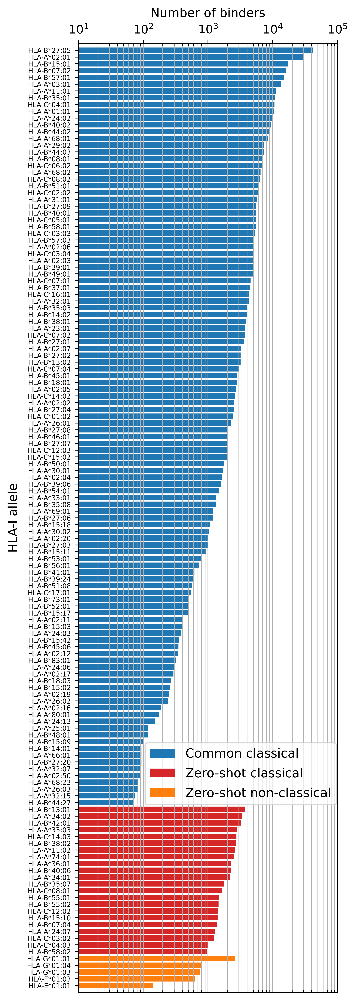

In [18]:
hlas = common_hla_list + new_hla_list1 + new_hla_list2
counts = common_num_list + new_num_list1 + new_num_list2
bar_colors = ['tab:blue']*len(common_hla_list) + ['tab:red']*len(new_hla_list1) + ['tab:orange']*len(new_hla_list2)

plt.rcParams['figure.figsize'] = (4.35, 16)
plt.rcParams['xtick.labelsize']=11
plt.rcParams['ytick.labelsize']=6.3

fig, ax = plt.subplots(1,1)
indexes1 = 1*np.arange(len(common_num_list))
indexes2 = indexes1[-1]+1*(np.arange(len(new_hla_list1))+1)
indexes3 = indexes2[-1]+1*(np.arange(len(new_hla_list2))+1)
ax.barh(indexes1, common_num_list, tick_label=common_hla_list, color='tab:blue')
ax.barh(indexes2, new_num_list1, tick_label=new_hla_list1, color='tab:red')
ax.barh(indexes3, new_num_list2, tick_label=new_hla_list2, color='tab:orange')

ax.set_xscale("log")
ax.set_xlim((1e1, 1e5))
ax.xaxis.tick_top()
ax.set_xlabel("Number of binders", fontsize=11.5, loc="center", labelpad=7.0)
ax.xaxis.set_label_position('top')

indexes = np.concatenate((indexes1,indexes2,indexes3))
ax.set_yticks(indexes, hlas)
ax.set_ylim((indexes[0]-1, indexes[-1]+1))
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_ylabel("HLA-I allele", fontsize=11.5, loc="center", labelpad=7.0)

ax.grid(axis='x', which='both')
ax.tick_params(bottom=True, left=True, direction='in', which="minor")

plt.legend(["Common classical", "Zero-shot classical", "Zero-shot non-classical"], 
           loc="lower right", bbox_to_anchor=[1.02,0.191], 
           labelspacing=0.6, fontsize=11.8, framealpha=0.75)
plt.savefig("./pngs_sup/sup1-3_1_small.png", dpi=dpi, bbox_inches='tight')
plt.savefig("./svgs_sup/sup1-3_1_small.svg", format='svg', dpi=dpi, bbox_inches='tight')

In [7]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = (9.0, 30.0)
plt.rcParams['xtick.labelsize']=19
plt.rcParams['ytick.labelsize']=19

fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, sharey=True)
ax1.plot(lengths, common_len_stat, color='tab:blue', marker='o', markersize=6, linewidth=1.26)
ax2.plot(lengths, newabc_len_stat, color='tab:red', marker='o', markersize=6, linewidth=1.26)
ax3.plot(lengths, neweg_len_stat, color='tab:orange', marker='o', markersize=6, linewidth=1.26)
ax4.plot(lengths, neg_len_stat, color='tab:green', marker='o', markersize=6, linewidth=1.26)

title_size = 23
label_size = 21

ax1.set_title("Common classical Set", fontsize=title_size)
ax1.set_ylabel("Proportion of peptides", fontsize=label_size)
ax1.set_xlabel('Length', fontsize=label_size)
ax1.grid(axis='both', which='both')

ax2.set_title("Zero-shot classical Set", fontsize=title_size)
ax2.set_ylabel("Proportion of peptides", fontsize=label_size)
ax2.set_xlabel('Length', fontsize=label_size)
ax2.grid(axis='both', which='both')

ax3.set_title("Zero-shot non-classical Set", fontsize=title_size)
ax3.set_ylabel("Proportion of peptides", fontsize=label_size)
ax3.set_xlabel('Length', fontsize=label_size)
ax3.grid(axis='both', which='both')

ax4.set_title("Negative candidate pool", fontsize=title_size)
ax4.set_ylabel("Proportion of peptides", fontsize=label_size)
ax4.set_xlabel('Length', fontsize=label_size)
ax4.grid(axis='both', which='both')

plt.yticks(np.arange(-0, 0.85, step=0.1))
plt.subplots_adjust(hspace=0.25)
plt.savefig("./pngs_sup/sup1-3_2_gai.png", dpi=dpi, bbox_inches='tight')
plt.savefig("./svgs_sup/sup1-3_2_gai.svg", format='svg', dpi=dpi, bbox_inches='tight')

---
### 3-2
- The relationship between binder lengths and ranking performance of HPL-Pan\non zero-shot non-classical HLA-I alleles

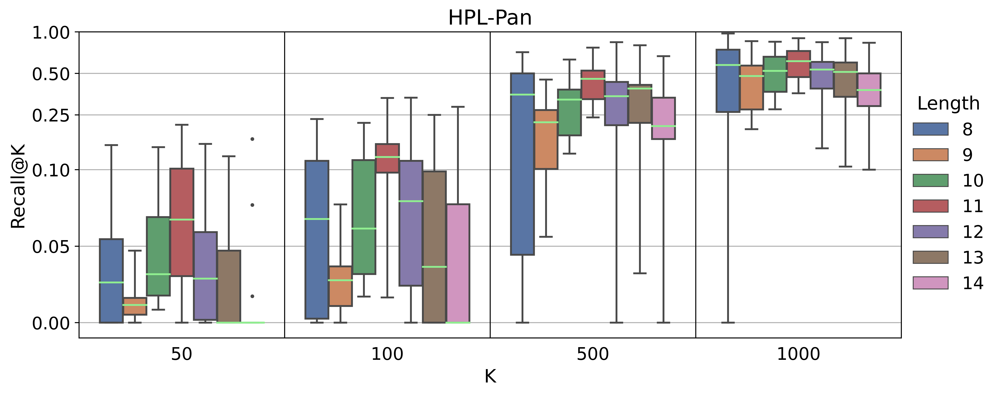

In [5]:
datapath = "../fullranking_csvs/zeroshot_abc/"
# init_res = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51.csv", index_col=0)
len8_res = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51_len8.csv", index_col=0)
len9_res = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51_len9.csv", index_col=0)
len10_res = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51_len10.csv", index_col=0)
len11_res = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51_len11.csv", index_col=0)
len12_res = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51_len12.csv", index_col=0)
len13_res = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51_len13.csv", index_col=0)
len14_res = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51_len14.csv", index_col=0)
# titlename = "HPL-Pan's performance with different lengths on zeto-shot classical HLA-I alleles"
titlename = "HPL-Pan"

# datapath = "../fullranking_csvs/zeroshot_abc/"
# # init_res = pd.read_csv(datapath + "TransPHLA/34mer_original_TransPHLA.csv", index_col=0)
# len8_res = pd.read_csv(datapath + "TransPHLA/34mer_original_TransPHLA_len8.csv", index_col=0)
# len9_res = pd.read_csv(datapath + "TransPHLA/34mer_original_TransPHLA_len9.csv", index_col=0)
# len10_res = pd.read_csv(datapath + "TransPHLA/34mer_original_TransPHLA_len10.csv", index_col=0)
# len11_res = pd.read_csv(datapath + "TransPHLA/34mer_original_TransPHLA_len11.csv", index_col=0)
# len12_res = pd.read_csv(datapath + "TransPHLA/34mer_original_TransPHLA_len12.csv", index_col=0)
# len13_res = pd.read_csv(datapath + "TransPHLA/34mer_original_TransPHLA_len13.csv", index_col=0)
# len14_res = pd.read_csv(datapath + "TransPHLA/34mer_original_TransPHLA_len14.csv", index_col=0)
# # titlename = "TransPHLA's performance with different lengths on zeto-shot classical HLA-I alleles"
# titlename = "TransPHLA"

res_dfs = [len8_res, len9_res, len10_res, len11_res, len12_res, len13_res, len14_res]
res_labels = ["8", "9", "10", "11", "12", "13", "14"]
plot_type = "box"
topk = ["50", '100', '500', '1000']
  
merged_res_dfs = []
for res, label in zip(res_dfs, res_labels):
    merged_res = pd.DataFrame(columns=["length","k","Recall","hla"])
    start = 0
    for k in topk:
        for ind, recall in enumerate(res["recall@" + k]):
            merged_res.loc[start+ind] = [label, k, recall, res["HLA"][ind]]
        start = start + ind + 1
    merged_res_dfs.append(merged_res)
all_merged_res = pd.concat(merged_res_dfs, axis=0)

from matplotlib.ticker import ScalarFormatter, FixedLocator
plt.rcParams['figure.figsize'] = (12.0, 4.5)
plt.rcParams['xtick.labelsize']=14.2
plt.rcParams['ytick.labelsize']=14.2

if plot_type == "box":
    g = sns.boxplot(data=all_merged_res, x="k", y="Recall", hue="length",
                    width=0.8, linewidth=1.5, whis=5,
                    notch=False, showcaps=True, palette="deep",
                    flierprops={"marker": "o"}, fliersize=2,
                    medianprops={"color": "lightgreen"}, saturation=0.75,)
elif plot_type == "violin":
    g = sns.violinplot(data=all_merged_res, x="k", y="Recall", hue="length")
elif plot_type == "swarm":
    g = sns.swarmplot(data=all_merged_res, x="k", y="Recall", dodge=True, hue="length", size=3)
elif plot_type == "strip":
    g = sns.stripplot(data=all_merged_res, x="k", y="Recall", dodge=True, hue="length")

g.set_yscale('symlog', linthresh=0.1)
g.yaxis.set_major_locator(FixedLocator([0.00,0.05,0.10,0.25,0.50,1.00]))
g.yaxis.set_major_formatter(ScalarFormatter())
g.set_ylim((-0.01,1.0))
g.set_xlim((-0.5,3.5))
g.grid(which='major', axis='y')
sns.move_legend(
    g, "center right", fontsize=14.2, title_fontsize=15,
    bbox_to_anchor=(1.12, 0.47),
    ncol=1, title="Length", frameon=False)

g.vlines([0.5, 1.5, 2.5], -0.01, 1, color="black", linewidth=0.8)
g.tick_params(bottom=False, left=True, direction='out')

plt.rc('axes', axisbelow=True)
plt.xlabel("K", fontsize=15)
plt.ylabel("Recall@K", fontsize=15)
plt.title(titlename, fontsize=17)
plt.savefig("./pngs_sup/sup3-2_1_gai.png", dpi=dpi, bbox_inches='tight')
plt.savefig("./svgs_sup/sup3-2_1_gai.svg", format='svg', dpi=dpi, bbox_inches='tight')

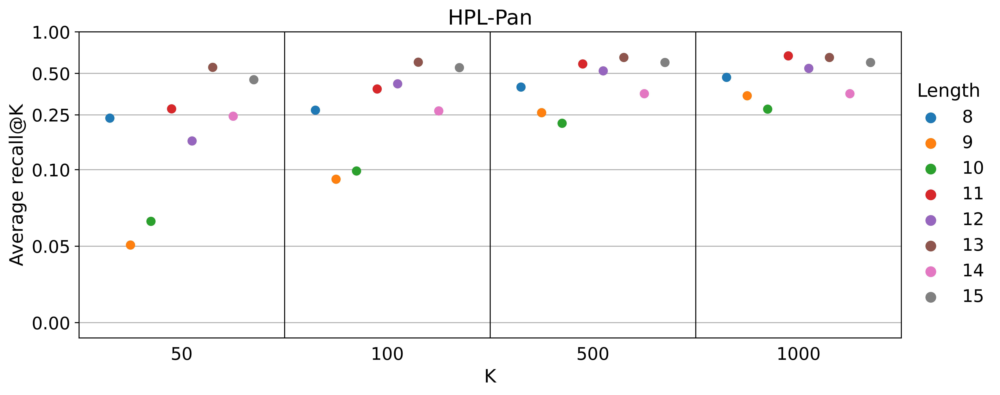

In [7]:
datapath = "../fullranking_csvs/zeroshot_eg/"
# init_res = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51.csv", index_col=0)
len8_res = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51_len8.csv", index_col=0)
len9_res = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51_len9.csv", index_col=0)
len10_res = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51_len10.csv", index_col=0)
len11_res = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51_len11.csv", index_col=0)
len12_res = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51_len12.csv", index_col=0)
len13_res = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51_len13.csv", index_col=0)
len14_res = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51_len14.csv", index_col=0)
len15_res = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51_len15.csv", index_col=0)
# titlename = "The relationship between binder lengths and ranking performance of HPL-Pan\non zero-shot non-classical HLA-I alleles"
titlename = "HPL-Pan"

# datapath = "../fullranking_csvs/zeroshot_eg/"
# # init_res = pd.read_csv(datapath + "TransPHLA/34mer_original_TransPHLA.csv", index_col=0)
# len8_res = pd.read_csv(datapath + "TransPHLA/34mer_original_TransPHLA_len8.csv", index_col=0)
# len9_res = pd.read_csv(datapath + "TransPHLA/34mer_original_TransPHLA_len9.csv", index_col=0)
# len10_res = pd.read_csv(datapath + "TransPHLA/34mer_original_TransPHLA_len10.csv", index_col=0)
# len11_res = pd.read_csv(datapath + "TransPHLA/34mer_original_TransPHLA_len11.csv", index_col=0)
# len12_res = pd.read_csv(datapath + "TransPHLA/34mer_original_TransPHLA_len12.csv", index_col=0)
# len13_res = pd.read_csv(datapath + "TransPHLA/34mer_original_TransPHLA_len13.csv", index_col=0)
# len14_res = pd.read_csv(datapath + "TransPHLA/34mer_original_TransPHLA_len14.csv", index_col=0)
# len15_res = pd.read_csv(datapath + "TransPHLA/34mer_original_TransPHLA_len15.csv", index_col=0)
# # titlename = "TransPHLA's performance with different lengths on zeto-shot non-classical HLA-I alleles"
# titlename = "TransPHLA"

res_dfs = [len8_res, len9_res, len10_res, len11_res, len12_res, len13_res, len14_res, len15_res]
res_labels = ["8", "9", "10", "11", "12", "13", "14", "15"]
plot_type = "swarm"
topk = ["50", '100', '500', '1000']
  
merged_res_dfs = []
for res, label in zip(res_dfs, res_labels):
    merged_res = pd.DataFrame(columns=["length","k","Recall"])
    start = 0
    for k in topk:
        sum_recall = 0
        for ind, recall in enumerate(res["recall@" + k]):
            sum_recall += recall
        merged_res.loc[start+1] = [label, k, sum_recall/(ind+1)]
        start = start + 1
    merged_res_dfs.append(merged_res)
all_merged_res = pd.concat(merged_res_dfs, axis=0)

from matplotlib.ticker import ScalarFormatter, FixedLocator
plt.rcParams['figure.figsize'] = (12.0, 4.5)
plt.rcParams['xtick.labelsize']=14.2
plt.rcParams['ytick.labelsize']=14.2

if plot_type == "box":
    g = sns.boxplot(data=all_merged_res, x="k", y="Recall", hue="length",
                    width=0.8, linewidth=1.5, whis=5,
                    notch=False, showcaps=True, palette="deep",
                    flierprops={"marker": "o"}, fliersize=2,
                    medianprops={"color": "lightgreen"}, saturation=0.75,)
elif plot_type == "violin":
    g = sns.violinplot(data=all_merged_res, x="k", y="Recall", hue="length")
elif plot_type == "swarm":
    g = sns.swarmplot(data=all_merged_res, x="k", y="Recall", dodge=True, hue="length", 
                      marker="o", size=7.5)
elif plot_type == "strip":
    g = sns.stripplot(data=all_merged_res, x="k", y="Recall", dodge=True, hue="length")

g.set_yscale('symlog', linthresh=0.1)
g.yaxis.set_major_locator(FixedLocator([0.00,0.05,0.10,0.25,0.50,1.00]))
g.yaxis.set_major_formatter(ScalarFormatter())
g.set_ylim((-0.01,1.0))
g.set_xlim((-0.5,3.5))
g.grid(which='major', axis='y')
sns.move_legend(
    g, "center right", fontsize=14.2, title_fontsize=15,
    bbox_to_anchor=(1.12, 0.47),
    ncol=1, title="Length", frameon=False)

g.vlines([0.5, 1.5, 2.5], -0.01, 1, color="black", linewidth=0.8)
g.tick_params(bottom=False, left=True, direction='out')

plt.rc('axes', axisbelow=True)
plt.xlabel("K", fontsize=15)
plt.ylabel("Average recall@K", fontsize=15)
plt.title(titlename, fontsize=17)
plt.savefig("./pngs_sup/sup3-2_3_gai.png", dpi=dpi, bbox_inches='tight')
plt.savefig("./svgs_sup/sup3-2_3_gai.svg", format='svg', dpi=dpi, bbox_inches='tight')

---
### 3-3

In [11]:
def plot_part3_1(ax, df1, df2, allele, df1_color, bar_width, chosen_topk=['50', '100', '500', '1000', '5000', '10000', '100000']):
    df1 = df1[df1['HLA'].isin([allele])]
    df2 = df2[df2['HLA'].isin([allele])]
    hit1, hit2 = [], []
    for k in chosen_topk:
        hit1.append(df1['hit@'+k].item())
        hit2.append(df2['hit@'+k].item())
    
    # dual-bar
    indexes = np.arange(len(chosen_topk))*0.7
    bar_container = ax.bar(indexes-bar_width/2, hit1, width=bar_width, 
                        #    edgecolor="none",
                           label='value')
    ax.bar_label(bar_container, fmt='%.0f', fontsize=12, label_type="center")  # 13.1
    bar_container = ax.bar(indexes+bar_width/2, hit2, width=bar_width, 
                        #    edgecolor="none", 
                           label='value', color=df1_color)
    ax.bar_label(bar_container, fmt='%.0f', fontsize=12, label_type="center")
    ax.set_xlim(indexes[0]-0.3, indexes[-1]+0.3)
    ax.set_xticks(indexes)
    ax.set_xticklabels(chosen_topk, fontsize=14)
    ax.set_ylim(0, 1000)
    ax.set_yticks(np.arange(len(chosen_topk)+1)*250)
    ax.set_yticklabels(np.arange(len(chosen_topk)+1)*250, fontsize=14)

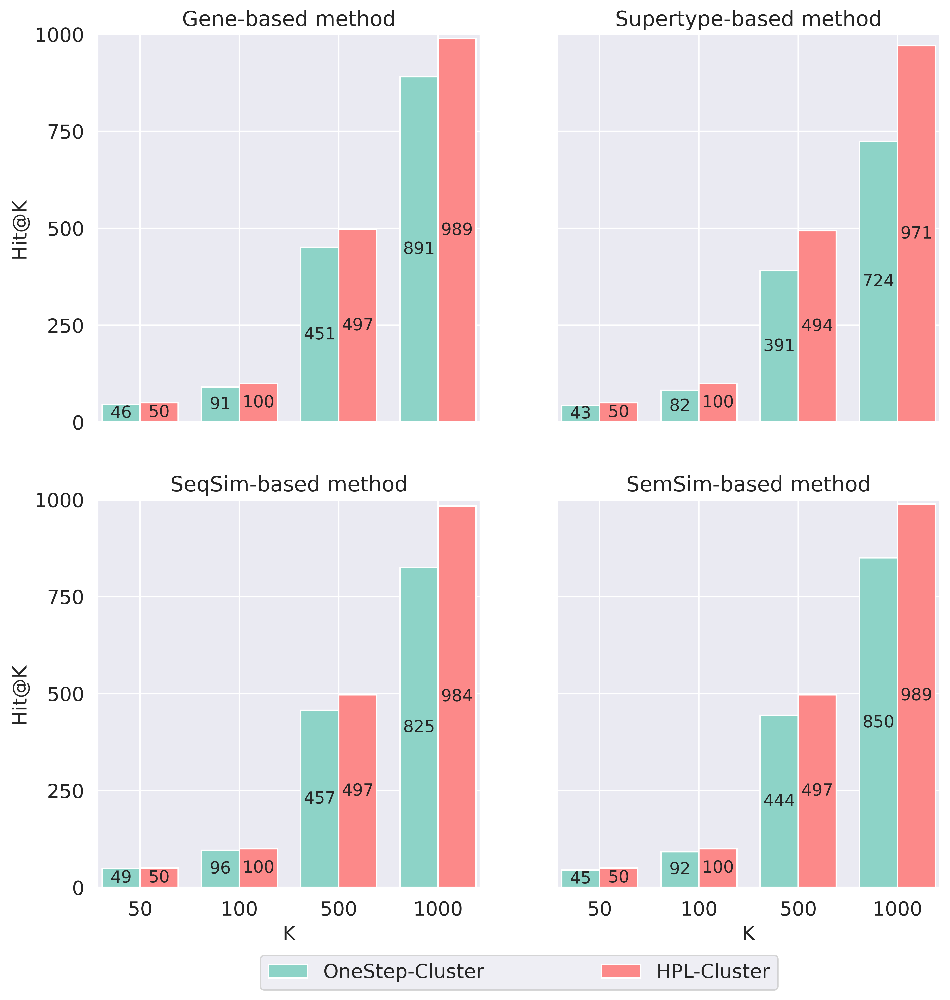

In [57]:
target_allele = "HLA-B*42:01"

datapath = "../fullranking_csvs/zeroshot_abc/"
res1 = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51.csv", index_col=0)
res2 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_B_gene_1e-05_ep10_B4201.csv", index_col=0)
res3 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_B_supertype_1e-05_ep9_B4201.csv", index_col=0)
res4 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_B_seq_more_6e-06_ep13_B4201.csv", index_col=0)
res5 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_B_semantic_equal_1e-05_ep18_B4201.csv", index_col=0)
res12 = pd.read_csv(datapath + "OneStep-Cluster/182mer_RN_ft_tape_B_gene_3e-05_ep37_B4201.csv", index_col=0)
res13 = pd.read_csv(datapath + "OneStep-Cluster/182mer_RN_ft_tape_B_supertype_1e-05_ep37_B4201.csv", index_col=0)
res14 = pd.read_csv(datapath + "OneStep-Cluster/182mer_RN_ft_tape_B_seq_more_6e-06_ep52_B4201.csv", index_col=0)
res15 = pd.read_csv(datapath + "OneStep-Cluster/182mer_RN_ft_tape_B_semantic_equal_1e-05_ep38_B4201.csv", index_col=0)

model_name = ["HPL-Pan",
              "HPL-Cluster\n(Gene-based)",
              "HPL-Cluster\n(Supertype-based)",
              "HPL-Cluster\n(SeqSim-based)",
              "HPL-Cluster\n(SemSim-based)",
              "OneStep-Cluster\n(Gene-based)",
              "OneStep-Cluster\n(Supertype-based)",
              "OneStep-Cluster\n(SeqSim-based)",
              "OneStep-Cluster\n(SemSim-based)"]
bigtitle = "Performance gains of {} allele-specific models over general prediction model".format(target_allele)

sns.set(style="darkgrid", palette="Set3")
plt.rcParams['figure.figsize'] = (10.8, 11)

colors = ['#a1c9f4', '#ffb482', '#8de5a1', '#ff9f9b', '#d0bbff', '#debb9b', '#fab0e4', '#cfcfcf', '#fffea3', '#b9f2f0']

fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(nrows=2, ncols=2, sharex=True, sharey=True)

leg_size = 14
bar_width = 0.268
hpl_color = "#fc8989"
plot_part3_1(ax1, res12, res2, target_allele, hpl_color, bar_width, chosen_topk=['50', '100', '500', '1000'])
# ax1.legend(["OneStep-Cluster", "HPL-Cluster"], loc="upper left",
#            fontsize=leg_size, labelspacing=0.9, frameon=False, 
#         #    bbox_to_anchor=[0.72,0.95]
#            )
# ax1.spines.right.set_visible(False)
# ax1.spines.top.set_visible(False)
ax1.set_ylabel('Hit@K', fontsize=14)
# ax1.tick_params(bottom='on', left='on',direction='out')
ax1.set_title("Gene-based method", fontsize=15)

plot_part3_1(ax2, res13, res3, target_allele, hpl_color, bar_width, chosen_topk=['50', '100', '500', '1000'])
# ax2.legend([model_name[0], model_name[6], model_name[2]], loc="upper left",
#            fontsize=leg_size, labelspacing=0.9, frameon=False, 
#         #    bbox_to_anchor=[0.805,0.95]
#            )
# ax2.spines.right.set_visible(False)
# ax2.spines.top.set_visible(False)
# ax2.tick_params(bottom='on', left='on',direction='out')
ax2.set_title("Supertype-based method", fontsize=15)

plot_part3_1(ax3, res14, res4, target_allele, hpl_color, bar_width, chosen_topk=['50', '100', '500', '1000'])
ax3.legend(["OneStep-Cluster", "HPL-Cluster"], loc="upper left",
           fontsize=leg_size, frameon=True, 
           ncol=2, columnspacing=6,
           bbox_to_anchor=[0.4,-0.15]
           )
# ax3.spines.right.set_visible(False)
# ax3.spines.top.set_visible(False)
ax3.set_xlabel('K', fontsize=14)
ax3.set_ylabel('Hit@K', fontsize=14)
# ax3.tick_params(bottom='on', left='on',direction='out')
ax3.set_title("SeqSim-based method", fontsize=15)

plot_part3_1(ax4, res15, res5, target_allele, hpl_color, bar_width, chosen_topk=['50', '100', '500', '1000'])
# ax4.legend([model_name[0], model_name[8], model_name[4]], loc="upper left",
#            fontsize=leg_size, labelspacing=0.9, frameon=False, 
#         #    bbox_to_anchor=[0.77,0.95]
#            )
# ax4.spines.right.set_visible(False)
# ax4.spines.top.set_visible(False)
ax4.set_xlabel('K', fontsize=14)
# ax4.tick_params(bottom='on', left='on', direction='out')
ax4.set_title("SemSim-based method", fontsize=15)

plt.subplots_adjust(wspace=0.2, hspace=0.2)
plt.savefig("./pngs_sup/sup3-3_1_gai.png", dpi=dpi, bbox_inches='tight')
plt.savefig("./svgs_sup/sup3-3_1_gai.svg", format='svg', dpi=dpi, bbox_inches='tight')

In [91]:
pal = "deep"
print(sns.color_palette(pal).as_hex())
sns.color_palette(pal)

['#4c72b0', '#dd8452', '#55a868', '#c44e52', '#8172b3', '#937860', '#da8bc3', '#8c8c8c', '#ccb974', '#64b5cd']


[(0.2980392156862745, 0.4470588235294118, 0.6901960784313725),
 (0.8666666666666667, 0.5176470588235295, 0.3215686274509804),
 (0.3333333333333333, 0.6588235294117647, 0.40784313725490196),
 (0.7686274509803922, 0.3058823529411765, 0.3215686274509804),
 (0.5058823529411764, 0.4470588235294118, 0.7019607843137254),
 (0.5764705882352941, 0.47058823529411764, 0.3764705882352941),
 (0.8549019607843137, 0.5450980392156862, 0.7647058823529411),
 (0.5490196078431373, 0.5490196078431373, 0.5490196078431373),
 (0.8, 0.7254901960784313, 0.4549019607843137),
 (0.39215686274509803, 0.7098039215686275, 0.803921568627451)]

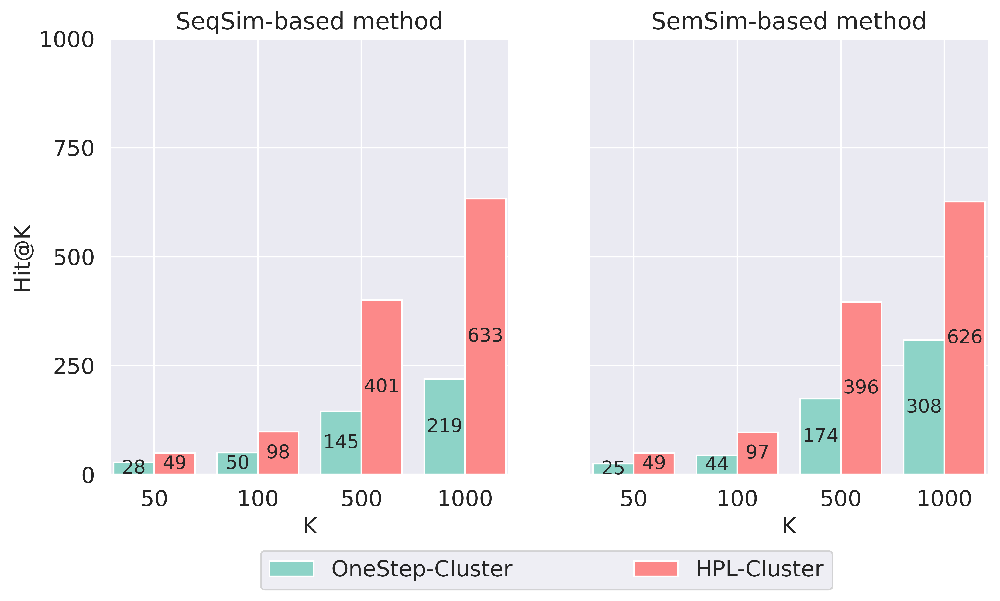

In [63]:
target_allele = "HLA-G*01:01"

datapath = "../fullranking_csvs/zeroshot_eg/"
res1 = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51.csv", index_col=0)
res4 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_G_seq_more_1e-05_ep13_G0101.csv", index_col=0)
res5 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_G_semantic_equal_1e-05_ep8_G0101.csv", index_col=0)
res14 = pd.read_csv(datapath + "OneStep-Cluster/182mer_RN_ft_tape_G_seq_more_1e-05_ep44_G0101.csv", index_col=0)
res15 = pd.read_csv(datapath + "OneStep-Cluster/182mer_RN_ft_tape_G_semantic_equal_1e-05_ep46_G0101.csv", index_col=0)

model_name = ["HPL-Pan",
              "HPL-Cluster\n(SeqSim-based)",
              "HPL-Cluster\n(SemSim-based)",
              "OneStep-Cluster\n(SeqSim-based)",
              "OneStep-Cluster\n(SemSim-based)"]
bigtitle = "Performance gains of {} allele-specific models over general prediction model".format(target_allele)

sns.set(style="darkgrid", palette="Set3")
plt.rcParams['figure.figsize'] = (10, 5)

colors = ['#a1c9f4', '#ffb482', '#8de5a1', '#ff9f9b', '#d0bbff', '#debb9b', '#fab0e4', '#cfcfcf', '#fffea3', '#b9f2f0']

fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True)

leg_size = 14
bar_width = 0.275
hpl_color = "#fc8989"
plot_part3_1(ax1, res14, res4, target_allele, hpl_color, bar_width, chosen_topk=['50', '100', '500', '1000'])
ax1.legend(["OneStep-Cluster", "HPL-Cluster"], loc="upper left",
           fontsize=leg_size, frameon=True, 
           ncol=2, columnspacing=5.5,
           bbox_to_anchor=[0.35,-0.15]
           )
# ax1.spines.right.set_visible(False)
# ax1.spines.top.set_visible(False)
ax1.set_ylabel('Hit@K', fontsize=14)
ax1.set_xlabel('K', fontsize=14)
ax1.set_title("SeqSim-based method", fontsize=15)
# ax1.tick_params(bottom='on', left='on',direction='out')

plot_part3_1(ax2, res15, res5, target_allele, hpl_color, bar_width, chosen_topk=['50', '100', '500', '1000'])
# ax2.legend([model_name[0], model_name[4], model_name[2]], loc="upper left",
#            fontsize=leg_size, labelspacing=0.9, frameon=False, 
#         #    bbox_to_anchor=[0.78,0.95]
#            )
# ax2.spines.right.set_visible(False)
# ax2.spines.top.set_visible(False)
ax2.set_xlabel('K', fontsize=14)
ax2.set_title("SemSim-based method", fontsize=15)
# ax2.tick_params(bottom='on', left='on',direction='out')

plt.subplots_adjust(wspace=0.2)
plt.savefig("./pngs_sup/sup3-3_2_gai.png", dpi=dpi, bbox_inches='tight')
plt.savefig("./svgs_sup/sup3-3_2_gai.svg", format='svg', dpi=dpi, bbox_inches='tight')

In [161]:
def plot_part3_2(ax, df0, df1, df2, allele, df1_color, bar_width, chosen_topk=['50', '100', '500', '1000', '5000', '10000', '100000']):
    df0 = df0[df0['HLA'].isin([allele])]
    df1 = df1[df1['HLA'].isin([allele])]
    df2 = df2[df2['HLA'].isin([allele])]
    gain1, gain2 = [], []
    for k in chosen_topk:
        gain1.append(df1['hit@'+k].item()-df0['hit@'+k].item())
        gain2.append(df2['hit@'+k].item()-df0['hit@'+k].item())
    
    # dual-bar
    indexes = np.arange(len(chosen_topk))*0.7
    bar_container = ax.bar(indexes, gain1, width=bar_width, 
                           edgecolor="none",
                           label='value', color="#459958")
    # ax.bar_label(bar_container, fmt='%.0f', fontsize=12, label_type="edge", color="#55a868")  # 13.1
    for ind, gain in zip(indexes, gain1):
        ax.text(ind, gain-12, "{:.0f}".format(gain), fontsize=12.5, color="#459958",
                horizontalalignment='center', verticalalignment='center')
    bar_container = ax.bar(indexes, gain2, width=bar_width,
                           edgecolor="none", 
                           label='value', color=df1_color)
    ax.bar_label(bar_container, fmt='%.0f', fontsize=12.5, label_type="edge", color=df1_color)
    ax.set_xlim(indexes[0]-0.3, indexes[-1]+0.3)
    ax.set_xticks(indexes)
    ax.set_xticklabels(chosen_topk, fontsize=14)
    ax.set_ylim(-350, 175)       # [-300,50]
    # ax.hlines(0, indexes[0]-0.3, indexes[-1]+0.3, color="white",linewidth=0.5)
    ax.set_yticks([0])
    ax.set_yticklabels([0], fontsize=14)

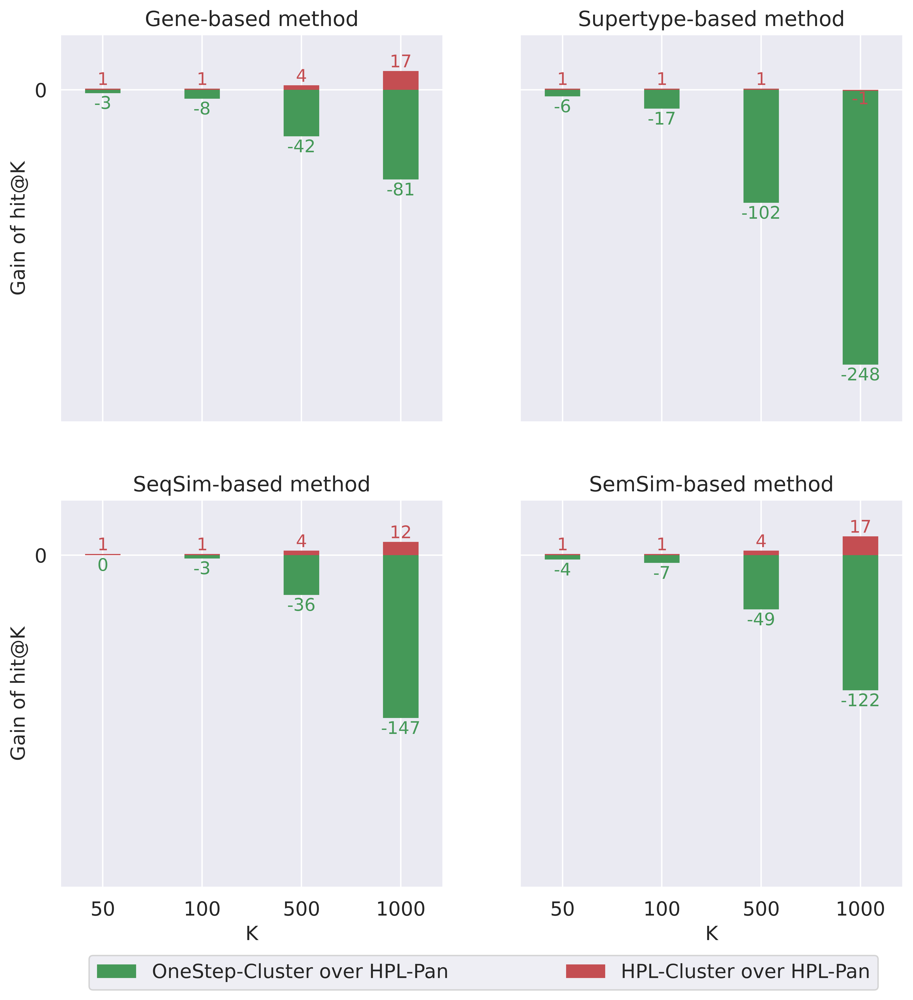

In [146]:
target_allele = "HLA-B*42:01"

datapath = "../fullranking_csvs/zeroshot_abc/"
res1 = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51.csv", index_col=0)
res2 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_B_gene_1e-05_ep10_B4201.csv", index_col=0)
res3 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_B_supertype_1e-05_ep9_B4201.csv", index_col=0)
res4 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_B_seq_more_6e-06_ep13_B4201.csv", index_col=0)
res5 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_B_semantic_equal_1e-05_ep18_B4201.csv", index_col=0)
res12 = pd.read_csv(datapath + "OneStep-Cluster/182mer_RN_ft_tape_B_gene_3e-05_ep37_B4201.csv", index_col=0)
res13 = pd.read_csv(datapath + "OneStep-Cluster/182mer_RN_ft_tape_B_supertype_1e-05_ep37_B4201.csv", index_col=0)
res14 = pd.read_csv(datapath + "OneStep-Cluster/182mer_RN_ft_tape_B_seq_more_6e-06_ep52_B4201.csv", index_col=0)
res15 = pd.read_csv(datapath + "OneStep-Cluster/182mer_RN_ft_tape_B_semantic_equal_1e-05_ep38_B4201.csv", index_col=0)

model_name = ["HPL-Pan",
              "HPL-Cluster\n(Gene-based)",
              "HPL-Cluster\n(Supertype-based)",
              "HPL-Cluster\n(SeqSim-based)",
              "HPL-Cluster\n(SemSim-based)",
              "OneStep-Cluster\n(Gene-based)",
              "OneStep-Cluster\n(Supertype-based)",
              "OneStep-Cluster\n(SeqSim-based)",
              "OneStep-Cluster\n(SemSim-based)"]
bigtitle = "Performance gains of {} allele-specific models over general prediction model".format(target_allele)

sns.set(style="darkgrid")
plt.rcParams['figure.figsize'] = (10.8, 11)

colors = ['#a1c9f4', '#ffb482', '#8de5a1', '#ff9f9b', '#d0bbff', '#debb9b', '#fab0e4', '#cfcfcf', '#fffea3', '#b9f2f0']

fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(nrows=2, ncols=2, sharex=True, sharey=True)

leg_size = 14
bar_width = 0.25
hpl_color = "#c44e52"
plot_part3_2(ax1, res1, res12, res2, target_allele, hpl_color, bar_width, chosen_topk=['50', '100', '500', '1000'])
# ax1.legend(["OneStep-Cluster", "HPL-Cluster"], loc="upper left",
#            fontsize=leg_size, labelspacing=0.9, frameon=False, 
#         #    bbox_to_anchor=[0.72,0.95]
#            )
# ax1.spines.right.set_visible(False)
# ax1.spines.top.set_visible(False)
ax1.set_ylabel('Gain of hit@K', fontsize=14)
# ax1.tick_params(bottom='on', left='on',direction='out')
ax1.set_title("Gene-based method", fontsize=15)

plot_part3_2(ax2, res1, res13, res3, target_allele, hpl_color, bar_width, chosen_topk=['50', '100', '500', '1000'])
# ax2.legend([model_name[0], model_name[6], model_name[2]], loc="upper left",
#            fontsize=leg_size, labelspacing=0.9, frameon=False, 
#         #    bbox_to_anchor=[0.805,0.95]
#            )
# ax2.spines.right.set_visible(False)
# ax2.spines.top.set_visible(False)
# ax2.tick_params(bottom='on', left='on',direction='out')
ax2.set_title("Supertype-based method", fontsize=15)

plot_part3_2(ax3, res1, res14, res4, target_allele, hpl_color, bar_width, chosen_topk=['50', '100', '500', '1000'])
ax3.legend(["OneStep-Cluster over HPL-Pan", "HPL-Cluster over HPL-Pan"], loc="upper left",
           fontsize=leg_size, frameon=True, 
           ncol=2, columnspacing=6,
           bbox_to_anchor=[0.05,-0.15]
           )
# ax3.spines.right.set_visible(False)
# ax3.spines.top.set_visible(False)
ax3.set_xlabel('K', fontsize=14)
ax3.set_ylabel('Gain of hit@K', fontsize=14)
# ax3.tick_params(bottom='on', left='on',direction='out')
ax3.set_title("SeqSim-based method", fontsize=15)

plot_part3_2(ax4, res1, res15, res5, target_allele, hpl_color, bar_width, chosen_topk=['50', '100', '500', '1000'])
# ax4.legend([model_name[0], model_name[8], model_name[4]], loc="upper left",
#            fontsize=leg_size, labelspacing=0.9, frameon=False, 
#         #    bbox_to_anchor=[0.77,0.95]
#            )
# ax4.spines.right.set_visible(False)
# ax4.spines.top.set_visible(False)
ax4.set_xlabel('K', fontsize=14)
# ax4.tick_params(bottom='on', left='on', direction='out')
ax4.set_title("SemSim-based method", fontsize=15)

plt.subplots_adjust(wspace=0.2, hspace=0.2)
plt.savefig("./pngs_sup/sup3-3_3_gai.png", dpi=dpi, bbox_inches='tight')
plt.savefig("./svgs_sup/sup3-3_3_gai.svg", format='svg', dpi=dpi, bbox_inches='tight')

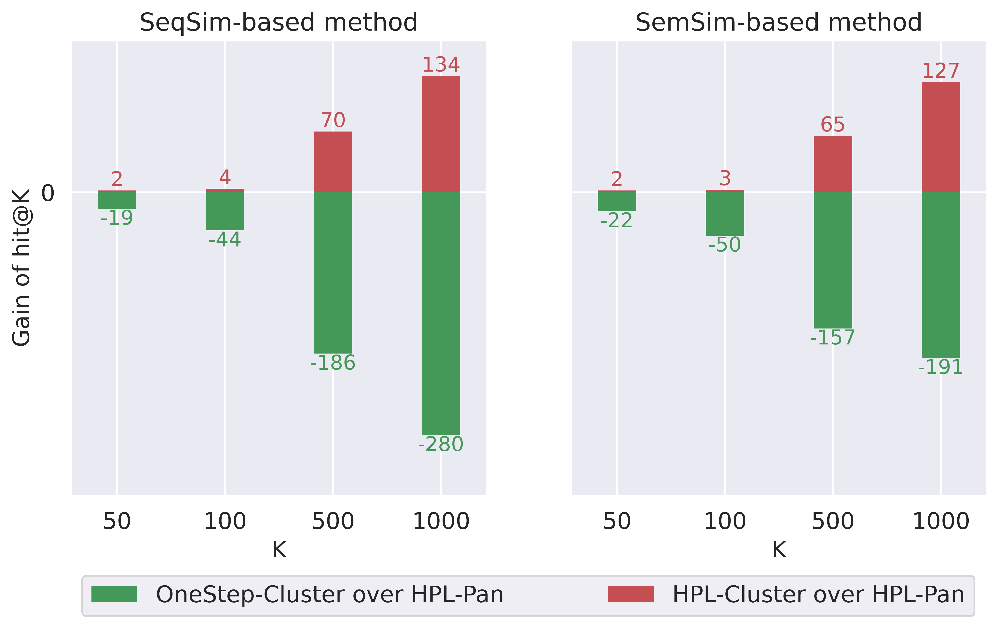

In [162]:
target_allele = "HLA-G*01:01"

datapath = "../fullranking_csvs/zeroshot_eg/"
res1 = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51.csv", index_col=0)
res4 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_G_seq_more_1e-05_ep13_G0101.csv", index_col=0)
res5 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_G_semantic_equal_1e-05_ep8_G0101.csv", index_col=0)
res14 = pd.read_csv(datapath + "OneStep-Cluster/182mer_RN_ft_tape_G_seq_more_1e-05_ep44_G0101.csv", index_col=0)
res15 = pd.read_csv(datapath + "OneStep-Cluster/182mer_RN_ft_tape_G_semantic_equal_1e-05_ep46_G0101.csv", index_col=0)

model_name = ["HPL-Pan",
              "HPL-Cluster\n(SeqSim-based)",
              "HPL-Cluster\n(SemSim-based)",
              "OneStep-Cluster\n(SeqSim-based)",
              "OneStep-Cluster\n(SemSim-based)"]
bigtitle = "Performance gains of {} allele-specific models over general prediction model".format(target_allele)

sns.set(style="darkgrid")
plt.rcParams['figure.figsize'] = (10, 5)

colors = ['#a1c9f4', '#ffb482', '#8de5a1', '#ff9f9b', '#d0bbff', '#debb9b', '#fab0e4', '#cfcfcf', '#fffea3', '#b9f2f0']

fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True)

leg_size = 14
bar_width = 0.25
hpl_color = "#c44e52"
plot_part3_2(ax1, res1, res14, res4, target_allele, hpl_color, bar_width, chosen_topk=['50', '100', '500', '1000'])
ax1.legend(["OneStep-Cluster over HPL-Pan", "HPL-Cluster over HPL-Pan"], loc="upper left",
           fontsize=leg_size, frameon=True, 
           ncol=2, columnspacing=4.5,
           bbox_to_anchor=[0,-0.15]
           )
# ax1.spines.right.set_visible(False)
# ax1.spines.top.set_visible(False)
ax1.set_ylabel('Gain of hit@K', fontsize=14)
ax1.set_xlabel('K', fontsize=14)
ax1.set_title("SeqSim-based method", fontsize=15)
# ax1.tick_params(bottom='on', left='on',direction='out')

plot_part3_2(ax2, res1, res15, res5, target_allele, hpl_color, bar_width, chosen_topk=['50', '100', '500', '1000'])
# ax2.legend([model_name[0], model_name[4], model_name[2]], loc="upper left",
#            fontsize=leg_size, labelspacing=0.9, frameon=False, 
#         #    bbox_to_anchor=[0.78,0.95]
#            )
# ax2.spines.right.set_visible(False)
# ax2.spines.top.set_visible(False)
ax2.set_xlabel('K', fontsize=14)
ax2.set_title("SemSim-based method", fontsize=15)
# ax2.tick_params(bottom='on', left='on',direction='out')

plt.subplots_adjust(wspace=0.2)
plt.savefig("./pngs_sup/sup3-3_4_gai.png", dpi=dpi, bbox_inches='tight')
plt.savefig("./svgs_sup/sup3-3_4_gai.svg", format='svg', dpi=dpi, bbox_inches='tight')

---
### 3-4

In [29]:
def plot_part3(ax, df1, df2, allele, df1_color, bar_width, chosen_topk=['50', '100', '500', '1000', '5000', '10000', '100000']):
    merged_HLA_res = pd.merge(df1, df2, on = ["HLA", "pos_num"])            # cat and remove duplicate columes
    merged_HLA_res = merged_HLA_res[merged_HLA_res['HLA'].isin([allele])]
    hit1, hit2, gains = [], [], []
    for k in chosen_topk:
        gains.append(merged_HLA_res['recall@'+k+'_x'].item() - merged_HLA_res['recall@'+k+'_y'].item())
        hit1.append(merged_HLA_res['hit@'+k+'_y'].item())
        hit2.append(merged_HLA_res['hit@'+k+'_x'].item())
    
    # dual-bar
    indexes = np.arange(len(chosen_topk))*0.7
    # bar_width = 0.24
    bar_container = ax.bar(indexes-bar_width/2, hit1, width=bar_width, 
                        #    edgecolor="none",
                           label='value')
    ax.bar_label(bar_container, fmt='%.0f', fontsize=13.1)  # 13.1
    bar_container = ax.bar(indexes+bar_width/2, hit2, width=bar_width, 
                        #    edgecolor="none", 
                           label='value', color=df1_color)
    ax.bar_label(bar_container, fmt='%.0f', fontsize=13.1)
    ax.set_xlim(indexes[0]-0.3, indexes[-1]+0.3)
    ax.set_xticks(indexes)
    ax.set_xticklabels(chosen_topk, fontsize=14.5)
    ax.set_ylim(0, 1050)
    ax.set_yticks(np.arange(len(chosen_topk)+1)*250)
    ax.set_yticklabels(np.arange(len(chosen_topk)+1)*250, fontsize=14.5)

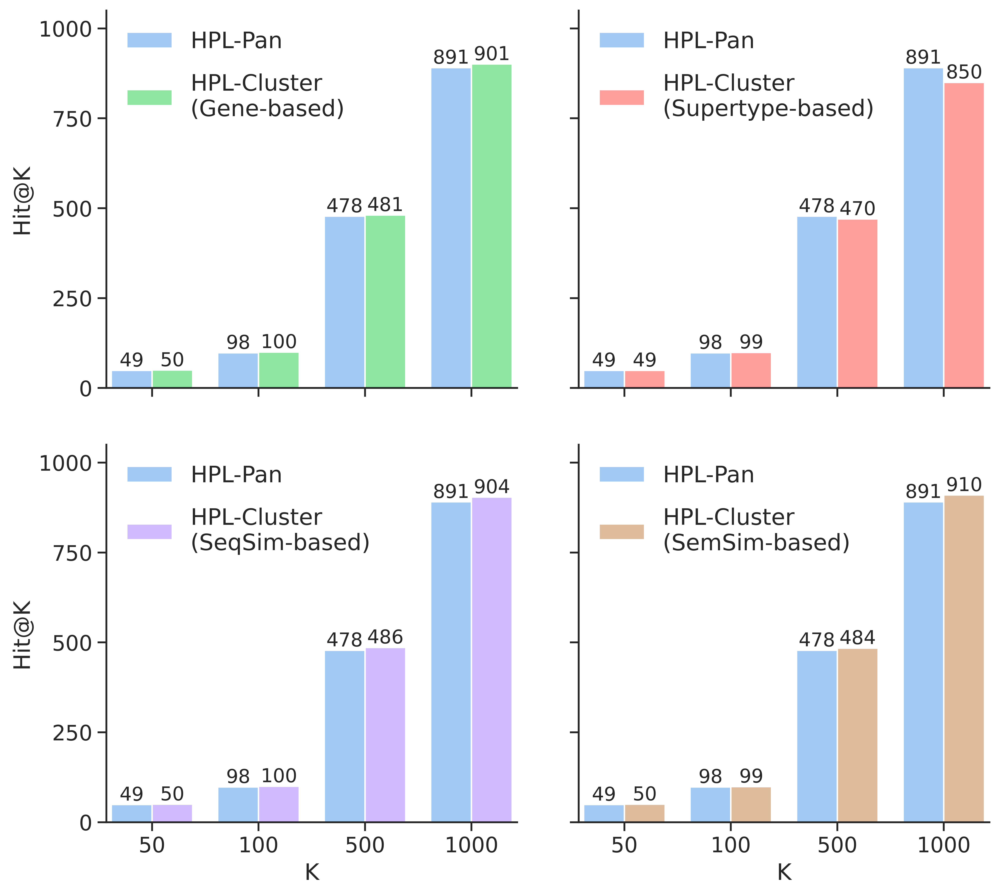

In [34]:
datapath = "../fullranking_csvs/zeroshot_abc/"
res1 = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51.csv", index_col=0)

# target_allele = "HLA-A*11:02"
# res2 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_A_gene_1e-05_ep17_A1102.csv", index_col=0)
# res3 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_A_supertype_1e-05_ep17_A1102.csv", index_col=0)
# res4 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_A_seq_more_1e-05_ep12_A1102.csv", index_col=0)
# res5 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_A_semantic_equal_1e-05_ep11_A1102.csv", index_col=0)
# res6 = pd.read_csv(datapath + "HPL-Allele/182mer_RN_ft_tape_ensemble_A1102_3.csv", index_col=0)

# target_allele = "HLA-A*33:03"
# res2 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_A_gene_1e-05_ep17_A3303.csv", index_col=0)
# res3 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_A_supertype_1e-05_ep17_A3303.csv", index_col=0)
# res4 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_A_seq_equal_1e-05_ep9_A3303.csv", index_col=0)
# res5 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_A_semantic_equal_1e-05_ep20_A3303.csv", index_col=0)
# res6 = pd.read_csv(datapath + "HPL-Allele/182mer_RN_ft_tape_ensemble_A3303_3.csv", index_col=0)

target_allele = "HLA-A*34:02"
res2 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_A_gene_1e-05_ep17_A3402.csv", index_col=0)
res3 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_A_supertype_1e-05_ep17_A3402.csv", index_col=0)
res4 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_A_seq_equal_1e-05_ep15_A3402.csv", index_col=0)
res5 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_A_semantic_less_1e-05_ep19_A3402.csv", index_col=0)
res6 = pd.read_csv(datapath + "HPL-Allele/182mer_RN_ft_tape_ensemble_A3402_3.csv", index_col=0)

model_name = ["HPL-Pan",
              "HPL-Cluster\n(Gene-based)",
              "HPL-Cluster\n(Supertype-based)",
              "HPL-Cluster\n(SeqSim-based)",
              "HPL-Cluster\n(SemSim-based)",
              "HPL-Allele"+"\n("+target_allele[:]+")"]
bigtitle = "Performance gains of {} allele-specific models over general prediction model".format(target_allele)

sns.set(style="white", palette="pastel")
plt.rcParams['figure.figsize'] = (10.8, 10)

colors = ['#a1c9f4', '#ffb482', '#8de5a1', '#ff9f9b', '#d0bbff', '#debb9b', '#fab0e4', '#cfcfcf', '#fffea3', '#b9f2f0']

fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(nrows=2, ncols=2, sharex=True, sharey=True)

leg_size = 15.5
bar_width = 0.268
plot_part3(ax1, res2, res1, target_allele, "#8de5a1", bar_width, chosen_topk=['50', '100', '500', '1000'])
ax1.legend([model_name[0], model_name[1]], loc="upper left",
           fontsize=leg_size, labelspacing=0.9, frameon=False, 
        #    bbox_to_anchor=[0.72,0.95]
           )
ax1.spines.right.set_visible(False)
ax1.spines.top.set_visible(False)
ax1.set_ylabel('Hit@K', fontsize=15.5)
ax1.tick_params(bottom='on', left='on',direction='out')

plot_part3(ax2, res3, res1, target_allele, "#ff9f9b", bar_width, chosen_topk=['50', '100', '500', '1000'])
ax2.legend([model_name[0], model_name[2]], loc="upper left",
           fontsize=leg_size, labelspacing=0.9, frameon=False, 
        #    bbox_to_anchor=[0.805,0.95]
           )
ax2.spines.right.set_visible(False)
ax2.spines.top.set_visible(False)
ax2.tick_params(bottom='on', left='on',direction='out')

plot_part3(ax3, res4, res1, target_allele, "#d0bbff", bar_width, chosen_topk=['50', '100', '500', '1000'])
ax3.legend([model_name[0], model_name[3]], loc="upper left",
           fontsize=leg_size, labelspacing=0.9, frameon=False, 
        #    bbox_to_anchor=[0.76,0.95]
           )
ax3.spines.right.set_visible(False)
ax3.spines.top.set_visible(False)
ax3.set_xlabel('K', fontsize=15.5)
ax3.set_ylabel('Hit@K', fontsize=15.5)
ax3.tick_params(bottom='on', left='on',direction='out')

plot_part3(ax4, res5, res1, target_allele, "#debb9b", bar_width, chosen_topk=['50', '100', '500', '1000'])
ax4.legend([model_name[0], model_name[4]], loc="upper left",
           fontsize=leg_size, labelspacing=0.9, frameon=False, 
        #    bbox_to_anchor=[0.77,0.95]
           )
ax4.spines.right.set_visible(False)
ax4.spines.top.set_visible(False)
ax4.set_xlabel('K', fontsize=15.5)
ax4.tick_params(bottom='on', left='on', direction='out')

plt.subplots_adjust(wspace=0.15, hspace=0.15)
plt.savefig("./pngs_sup/sup3-4_31.png", dpi=dpi, bbox_inches='tight')
plt.savefig("./svgs_sup/sup3-4_31.svg", format='svg', dpi=dpi, bbox_inches='tight')

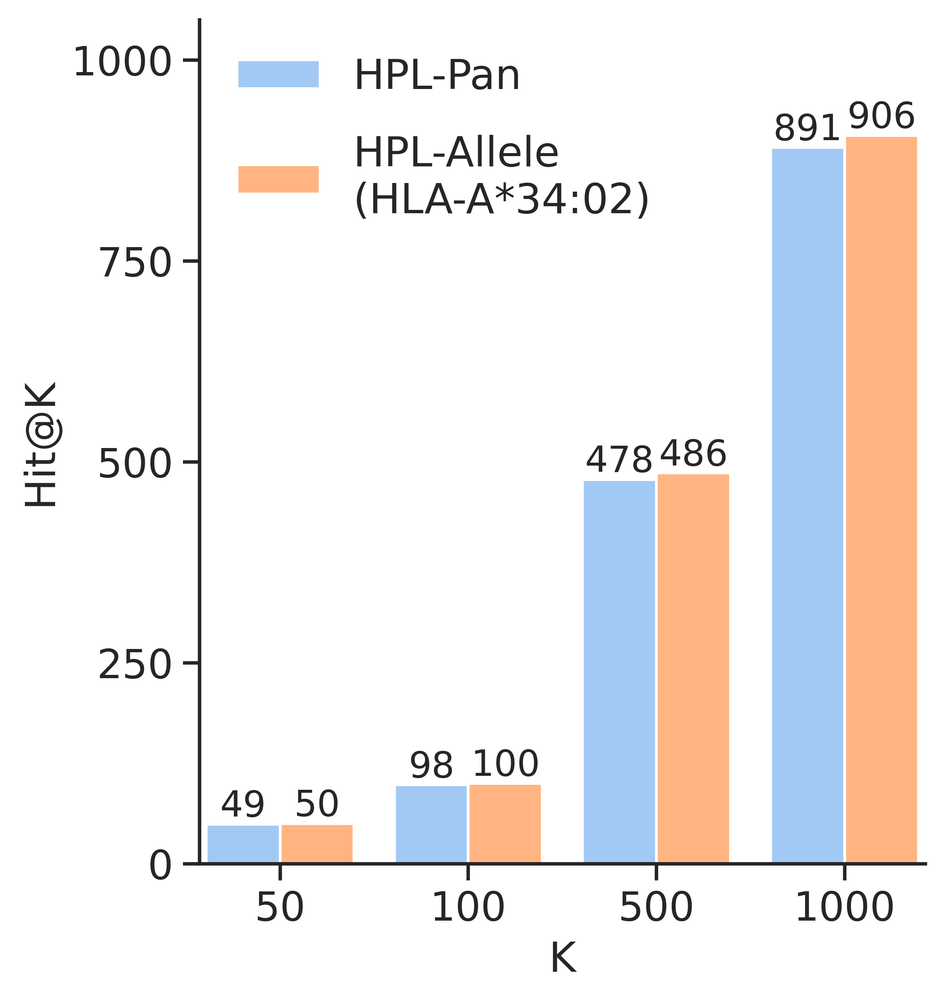

In [35]:
plt.rcParams['figure.figsize'] = (4.7, 5.5)  # 5.3,6
fig, ax1 = plt.subplots(nrows=1, ncols=1, sharex=True, sharey=True)

leg_size = 15
bar_width = 0.275
plot_part3(ax1, res6, res1, target_allele, "#ffb482", bar_width, chosen_topk=['50', '100', '500', '1000'])
ax1.legend([model_name[0], model_name[-1]], loc="upper left",
           fontsize=leg_size, labelspacing=0.9, frameon=False, 
        #    bbox_to_anchor=[0.51,0.95]
           )
ax1.spines.right.set_visible(False)
ax1.spines.top.set_visible(False)
ax1.set_ylabel('Hit@K', fontsize=15)
ax1.set_xlabel('K', fontsize=15)
ax1.tick_params(bottom='on', left='on',direction='out')

plt.savefig("./pngs_sup/sup3-4_32.png", dpi=dpi, bbox_inches='tight')
plt.savefig("./svgs_sup/sup3-4_32.svg", format='svg', dpi=dpi, bbox_inches='tight')

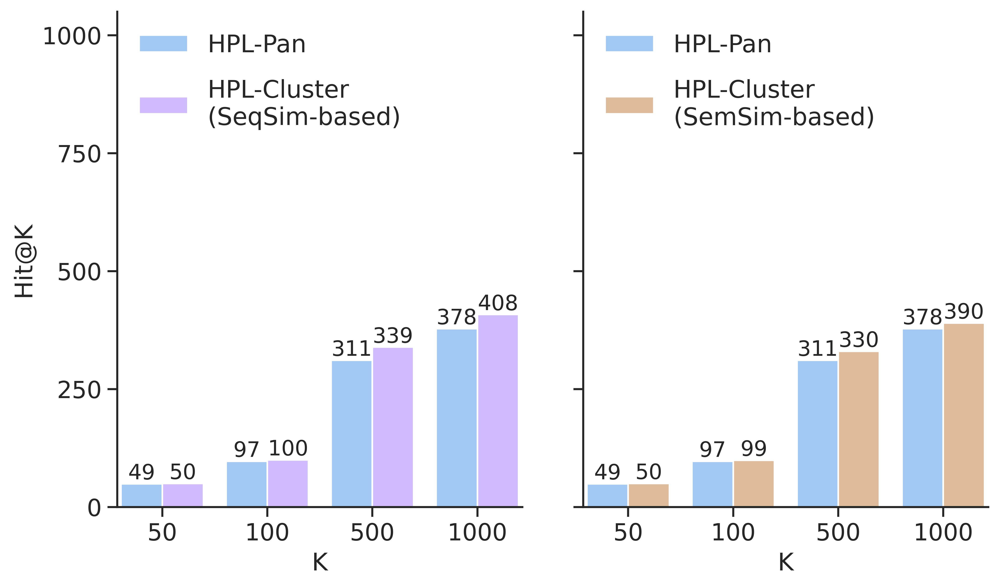

In [36]:
target_allele = "HLA-E*01:03"

datapath = "../fullranking_csvs/zeroshot_eg/"
res1 = pd.read_csv(datapath + "HPL-Pan/182mer_RN_ft_tape_cat_mean_3e-05_ep51.csv", index_col=0)
res4 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_E_seq_more_1e-05_ep15_E0103.csv", index_col=0)
res5 = pd.read_csv(datapath + "HPL-Cluster/182mer_RN_ft_tape_E_semantic_equal_1e-05_ep8_E0103.csv", index_col=0)
res6 = pd.read_csv(datapath + "HPL-Allele/182mer_RN_ft_tape_ensemble_E0103.csv", index_col=0)

model_name = ["HPL-Pan",
              "HPL-Cluster\n(SeqSim-based)",
              "HPL-Cluster\n(SemSim-based)",
              "HPL-Allele"+"\n("+target_allele[:]+")"]
bigtitle = "Performance gains of {} allele-specific models over general prediction model".format(target_allele)

sns.set(style="white", palette="pastel")
plt.rcParams['figure.figsize'] = (9.6, 5.5)

colors = ['#a1c9f4', '#ffb482', '#8de5a1', '#ff9f9b', '#d0bbff', '#debb9b', '#fab0e4', '#cfcfcf', '#fffea3', '#b9f2f0']

fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True)

leg_size = 15
bar_width = 0.275
plot_part3(ax1, res4, res1, target_allele, "#d0bbff", bar_width, chosen_topk=['50', '100', '500', '1000'])
ax1.legend([model_name[0], model_name[1]], loc="upper left",
           fontsize=leg_size, labelspacing=0.9, frameon=False, 
        #    bbox_to_anchor=[0.77,0.95]
           )
ax1.spines.right.set_visible(False)
ax1.spines.top.set_visible(False)
ax1.set_ylabel('Hit@K', fontsize=15)
ax1.set_xlabel('K', fontsize=15)
ax1.tick_params(bottom='on', left='on',direction='out')

plot_part3(ax2, res5, res1, target_allele, "#debb9b", bar_width, chosen_topk=['50', '100', '500', '1000'])
ax2.legend([model_name[0], model_name[2]], loc="upper left",
           fontsize=leg_size, labelspacing=0.9, frameon=False, 
        #    bbox_to_anchor=[0.78,0.95]
           )
ax2.spines.right.set_visible(False)
ax2.spines.top.set_visible(False)
ax2.set_xlabel('K', fontsize=15)
ax2.tick_params(bottom='on', left='on',direction='out')

plt.subplots_adjust(wspace=0.15)
plt.savefig("./pngs_sup/sup3-4_41.png", dpi=dpi, bbox_inches='tight')
plt.savefig("./svgs_sup/sup3-4_41.svg", format='svg', dpi=dpi, bbox_inches='tight')

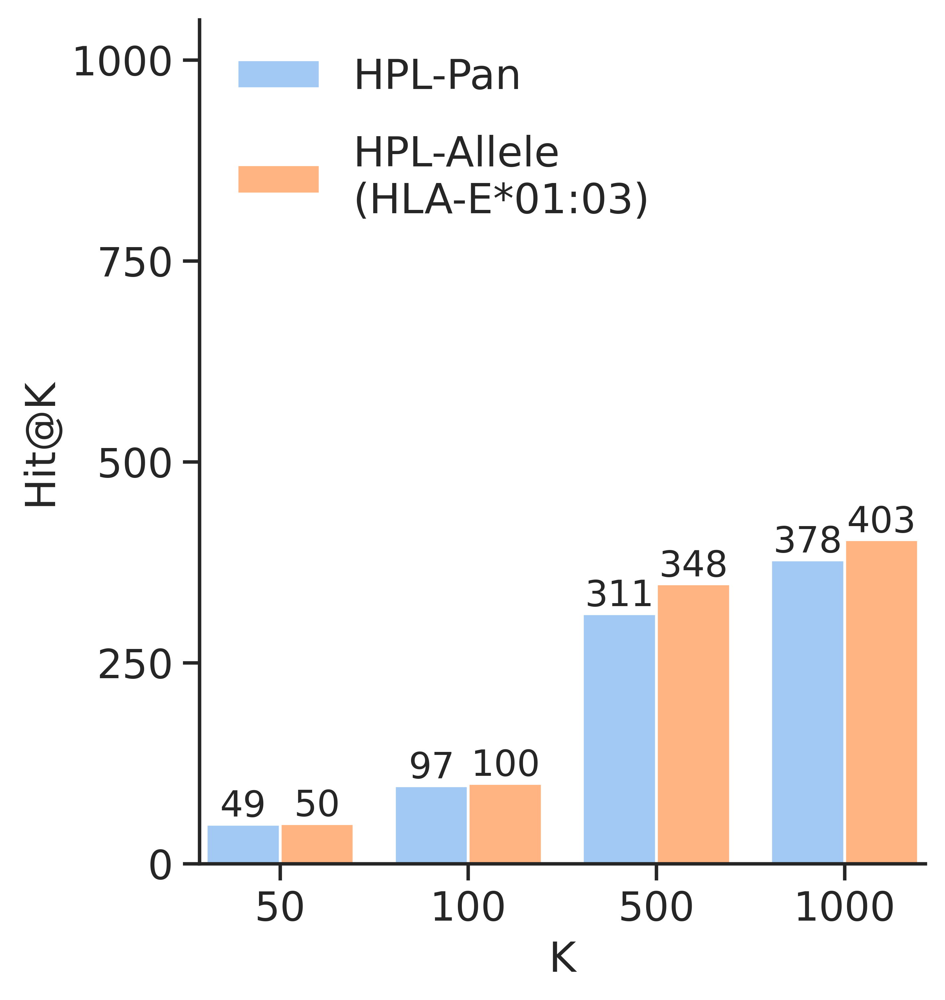

In [37]:
plt.rcParams['figure.figsize'] = (4.7, 5.5)
fig, ax1 = plt.subplots(nrows=1, ncols=1, sharex=True, sharey=True)

leg_size = 15
bar_width = 0.275
plot_part3(ax1, res6, res1, target_allele, "#ffb482", bar_width,chosen_topk=['50', '100', '500', '1000'])
ax1.legend([model_name[0], model_name[-1]], loc="upper left",
           fontsize=leg_size, labelspacing=0.9, frameon=False, 
        #    bbox_to_anchor=[0.51,0.95]
           )
ax1.spines.right.set_visible(False)
ax1.spines.top.set_visible(False)
ax1.set_ylabel('Hit@K', fontsize=15)
ax1.set_xlabel('K', fontsize=15)
ax1.tick_params(bottom='on', left='on',direction='out')

plt.savefig("./pngs_sup/sup3-4_42.png", dpi=dpi, bbox_inches='tight')
plt.savefig("./svgs_sup/sup3-4_42.svg", format='svg', dpi=dpi, bbox_inches='tight')

In [1]:
import pandas as pd
import numpy as np

# load dataset
data_path = "../neoag_data/main_task/"
train_data = pd.read_csv(data_path+"train_data_fold4.csv", index_col=0)
valid_data = pd.read_csv(data_path+"val_data_fold4.csv", index_col=0)
test_data = pd.read_csv(data_path+"independent_set.csv", index_col=0)
new_classical_data = pd.read_csv(data_path+"zeroshot_abc_set.csv", index_col=0)
new_nonclassical_data = pd.read_csv(data_path+"zeroshot_set.csv", index_col=0)
neg_pep_seg_pools = np.load(data_path+"IEDB_negative_segments.npy",allow_pickle=True)

# binders
common_classical_data = pd.concat((train_data, valid_data, test_data), axis=0)
common_classical_data = common_classical_data[common_classical_data.label==1]
new_classical_data = new_classical_data[new_classical_data.label==1]
new_nonclassical_data = new_nonclassical_data[new_nonclassical_data.label==1]

In [2]:
len(common_classical_data)

445061

In [3]:
len(train_data[train_data.label==1]), len(valid_data[valid_data.label==1]), len(test_data[test_data.label==1])

(287348, 71837, 85876)

In [4]:
train_data[train_data.label==1].peptide.nunique()

200372